# DM-23425-February-2020-ap_pipe-rerun

This is the ~monthly ap_pipe rerun of the HiTS 2015 dataset (all 3 fields). This rerun used the templates generated for the January 2020 rerun.

Note that to reproduce the plots here, the ap_pipe-notebooks repo must be up to date with DM-20556.

**There are no substantial changes between the Jan 2020 rerun and this new one.** Some plots for comparison are at the bottom of the notebook.

In [1]:
%matplotlib notebook

import os
import sys
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import sqlite3
import importlib
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

import lsst.daf.persistence as dafPersist
import lsst.geom
import lsst.pipe.base as pipeBase
import lsst.afw.display as afwDisplay

In [2]:
repo = '/project/mrawls/hits2015/rerun/cw_2020_02'

In [3]:
sys.path.append('/project/mrawls/ap_pipe-notebooks/')
import diaObjectAnalysis as doa
import plotLightcurve as plc
import apdbPlots as pla

In [43]:
# Only if you change anything in the code imported above
importlib.reload(doa)
importlib.reload(plc)
importlib.reload(pla)

<module 'apdbPlots' from '/project/mrawls/ap_pipe-notebooks/apdbPlots.py'>

In [5]:
objTable, srcTable, goodObj, goodSrc = pla.loadTables(repo)

/opt/lsst/software/stack/stack/miniconda3-4.7.10-4d7b902/Linux64/ap_association/19.0.0-13-g744ec97+1/python/lsst/ap/association/mapApData.py:388: YAMLLoadWarning: calling yaml.load_all() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  table_list = list(yaml.load_all(yaml_stream))


## Plots from the latest Feb 2020 rerun

<IPython.core.display.Javascript object>


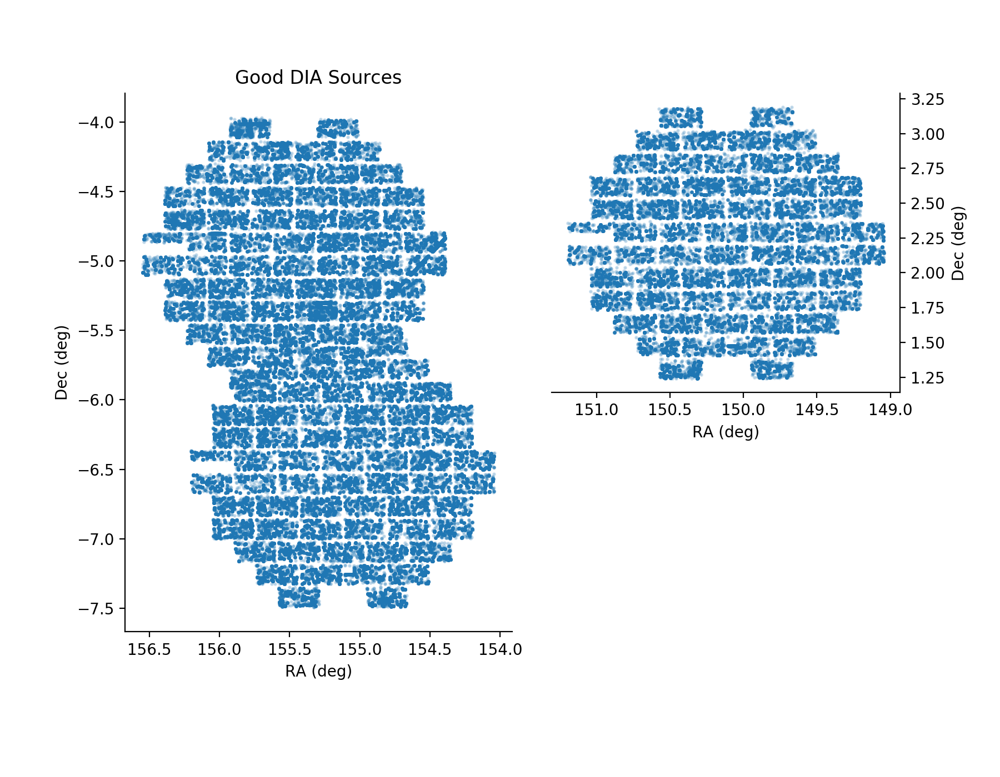

In [11]:
pla.plotHitsSourcesOnSky(goodSrc, title='Good DIA Sources')

<IPython.core.display.Javascript object>


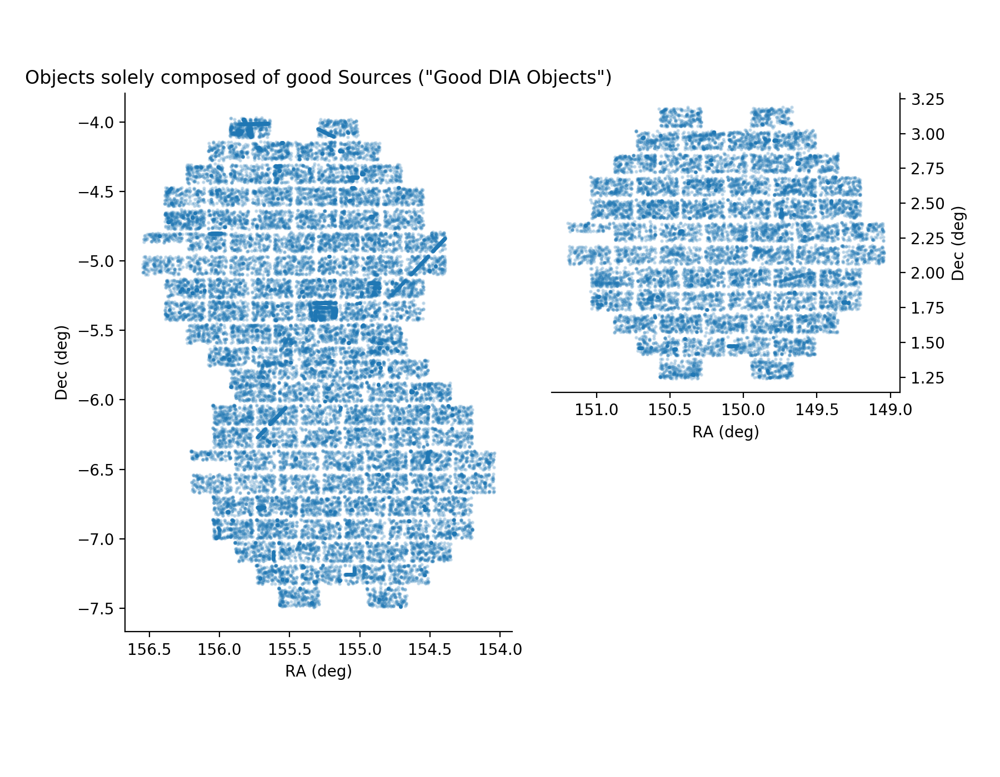

In [19]:
pla.plotHitsSourcesOnSky(goodObj, title='Objects solely composed of good Sources ("Good DIA Objects")')

<IPython.core.display.Javascript object>


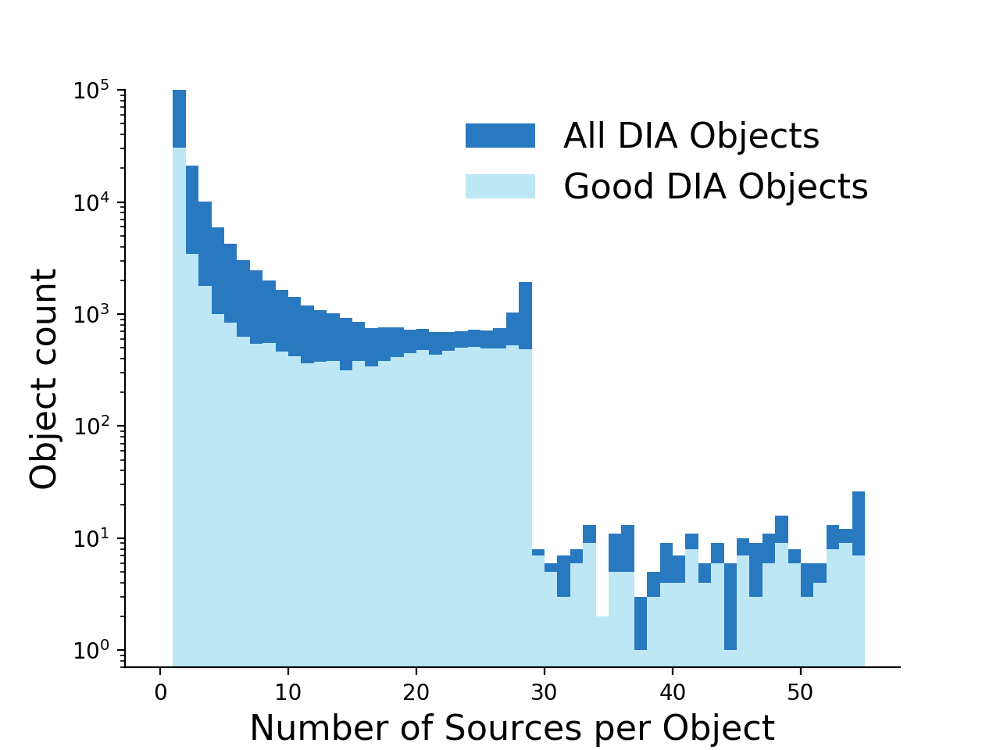

In [22]:
histogram = doa.plotDiaObjectHistogram(objTable, goodObj, label1='All DIA Objects', label2='Good DIA Objects')

<IPython.core.display.Javascript object>


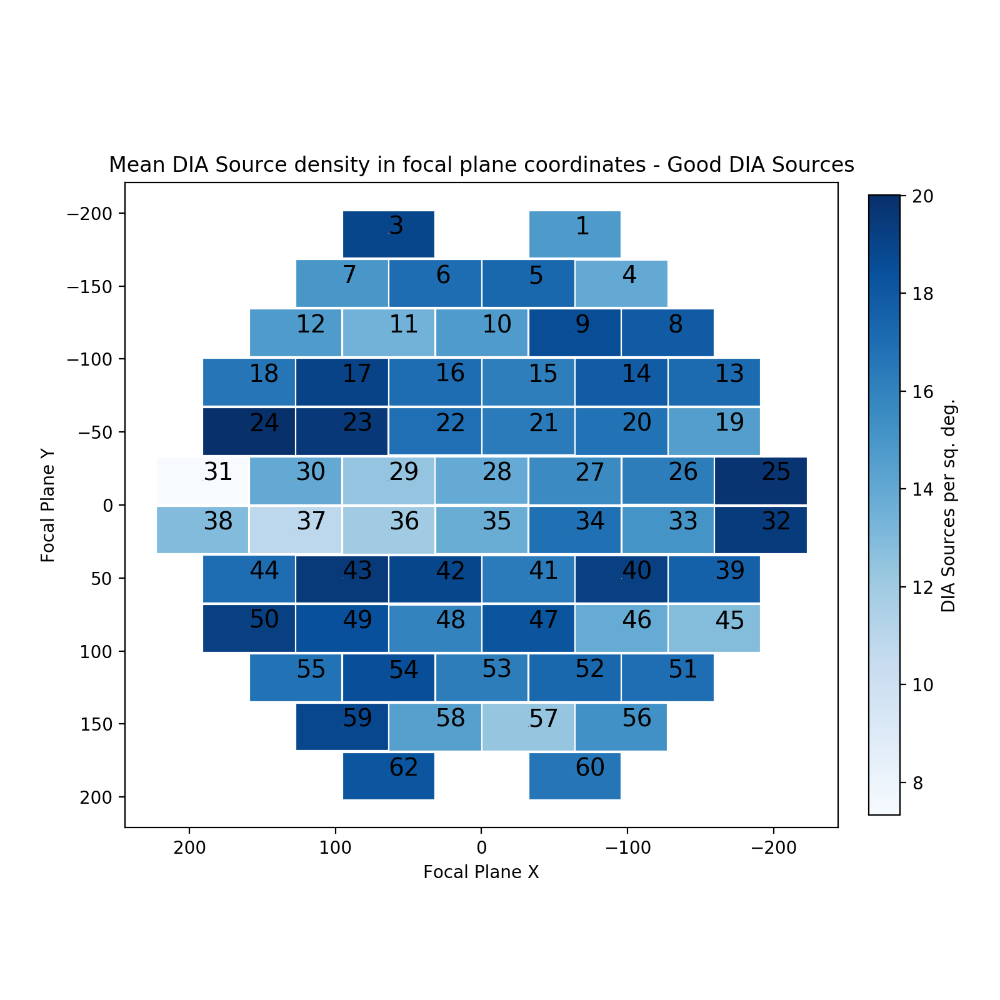

In [44]:
pla.plotDiaSourceDensityInFocalPlane(repo, goodSrc, title='- Good DIA Sources')

<IPython.core.display.Javascript object>


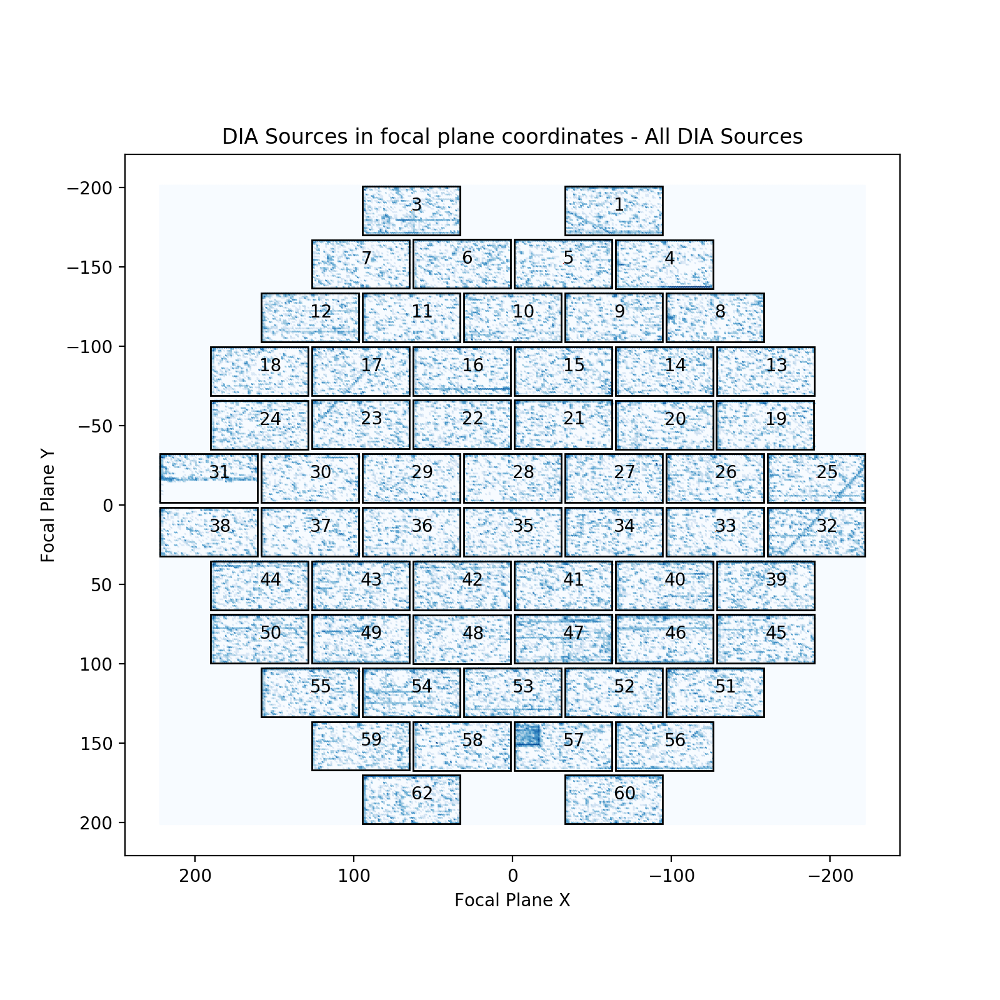

In [46]:
pla.plotDiaSourcesInFocalPlane(repo, srcTable, title='- All DIA Sources')

<IPython.core.display.Javascript object>


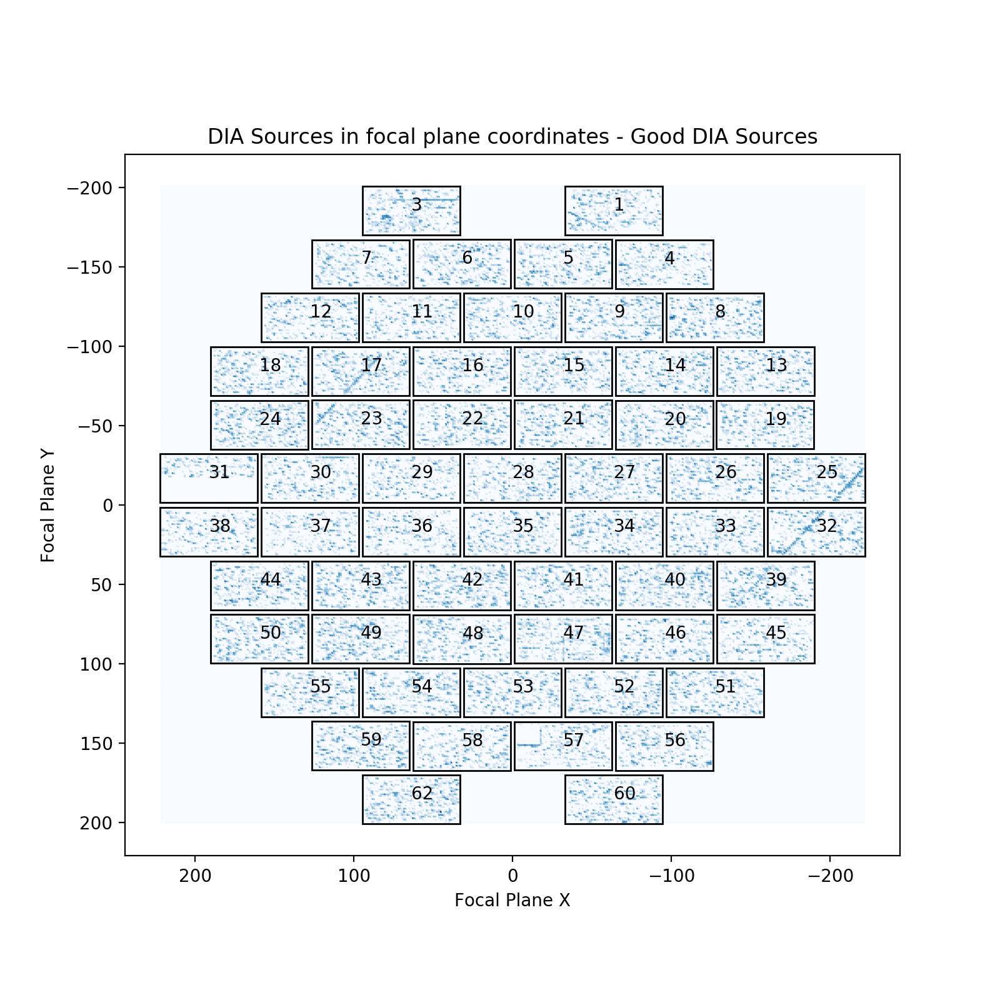

In [47]:
pla.plotDiaSourcesInFocalPlane(repo, goodSrc, title='- Good DIA Sources')

## Plots from last month's Jan 2020 rerun, for comparison

In [50]:
repo_old = '/project/mrawls/hits2015/rerun/cw_2020_01'

In [51]:
objTable_old, srcTable_old, goodObj_old, goodSrc_old = pla.loadTables(repo_old)

/opt/lsst/software/stack/stack/miniconda3-4.7.10-4d7b902/Linux64/ap_association/19.0.0-13-g744ec97+1/python/lsst/ap/association/mapApData.py:388: YAMLLoadWarning: calling yaml.load_all() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  table_list = list(yaml.load_all(yaml_stream))


### Comparing DIA Source counts

In [62]:
print(len(srcTable), len(srcTable_old))
print(len(goodSrc), len(goodSrc_old))
print(len(objTable), len(objTable_old))
print(len(goodObj), len(goodObj_old))

633989 634915
218995 219233
178098 178180
48308 48337


<IPython.core.display.Javascript object>


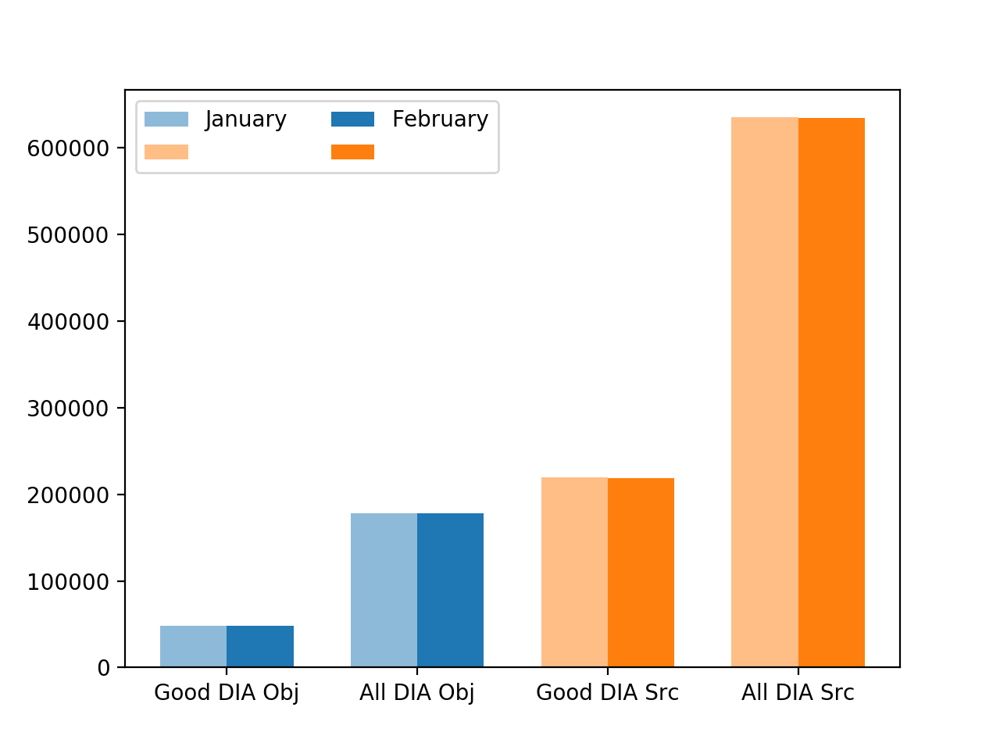

In [65]:
srcTable1 = srcTable_old
goodSrc1 = goodSrc_old
objTable1 = objTable_old
goodObj1 = goodObj_old
srcTable2 = srcTable
goodSrc2 = goodSrc
objTable2 = objTable
goodObj2 = goodObj

fig, ax = plt.subplots()
barLabels = ['Good DIA Obj', 'All DIA Obj', 'Good DIA Src', 'All DIA Src']
xbar = np.array([0, 1])
width = 0.35

# January
ax.bar(xbar - width/2, [len(goodObj1), len(objTable1)], 
       width, label='January', color='C0', alpha=0.5)
ax.bar(xbar + 2 - width/2, [len(goodSrc1), len(srcTable1)],
       width, label=' ', color='C1', alpha=0.5)

# February
ax.bar(xbar + width/2, [len(goodObj2), len(objTable2)], 
       width, label='February', color='C0')
ax.bar(xbar + 2 + width/2, [len(goodSrc2), len(srcTable2)],
       width, label=' ', color='C1')

plt.legend(ncol=2)
ax.set_xticks([0, 1, 2, 3])
labels = ax.set_xticklabels(barLabels)

<IPython.core.display.Javascript object>


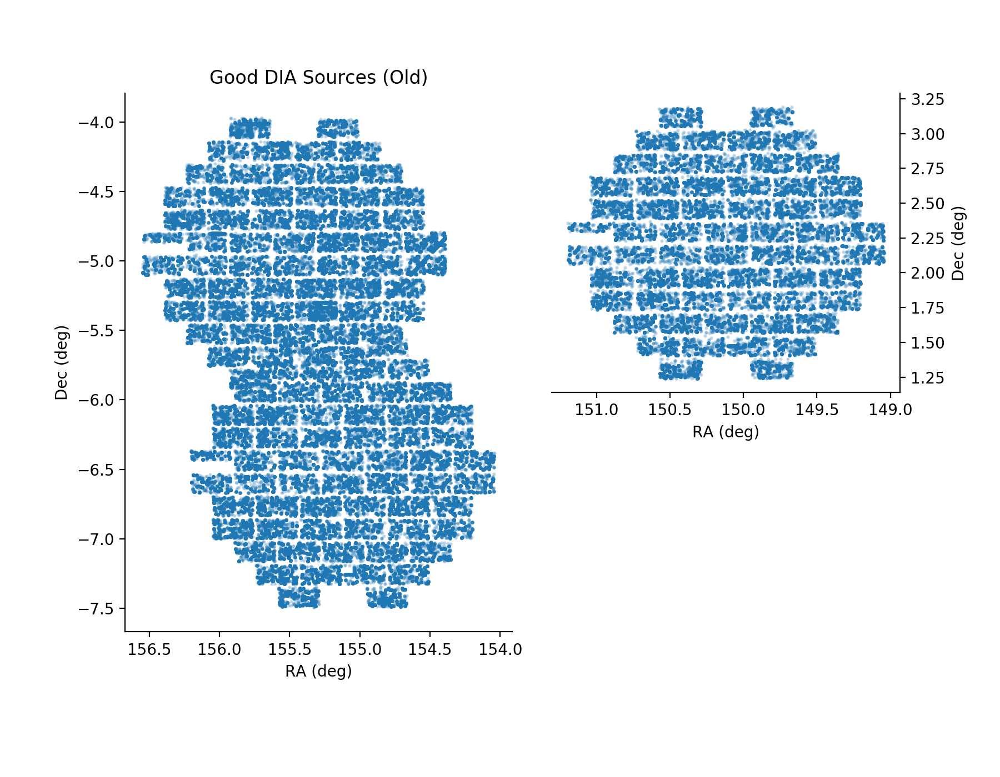

In [52]:
pla.plotHitsSourcesOnSky(goodSrc_old, title='Good DIA Sources (Old)')

<IPython.core.display.Javascript object>


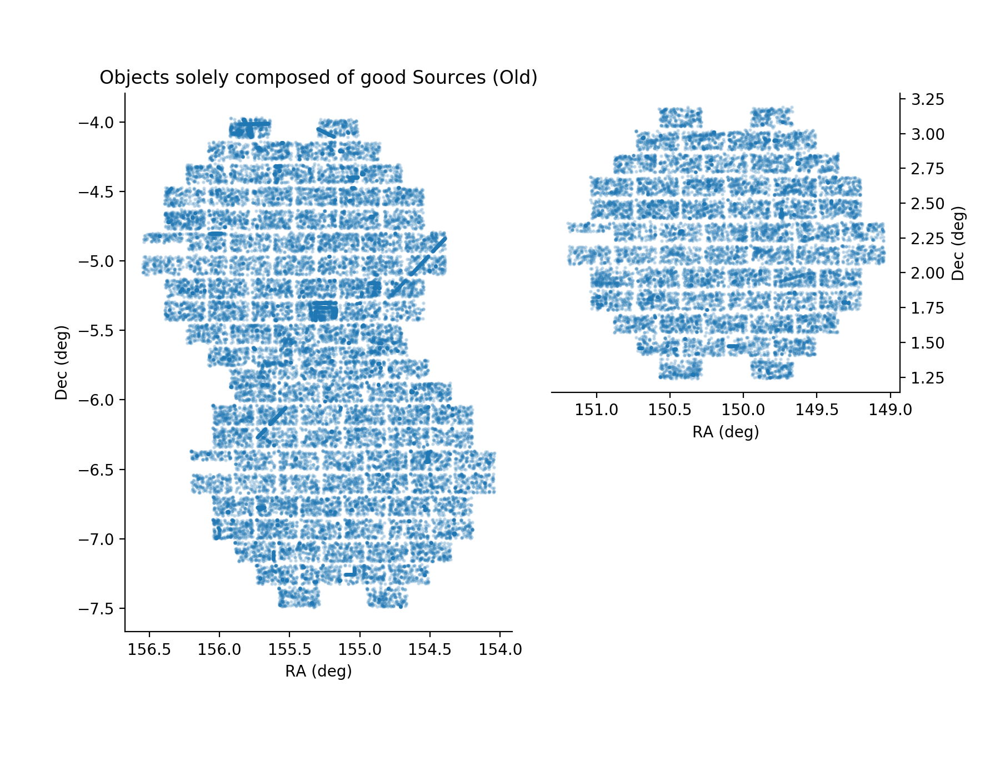

In [53]:
pla.plotHitsSourcesOnSky(goodObj_old, title='Objects solely composed of good Sources (Old)')

<IPython.core.display.Javascript object>


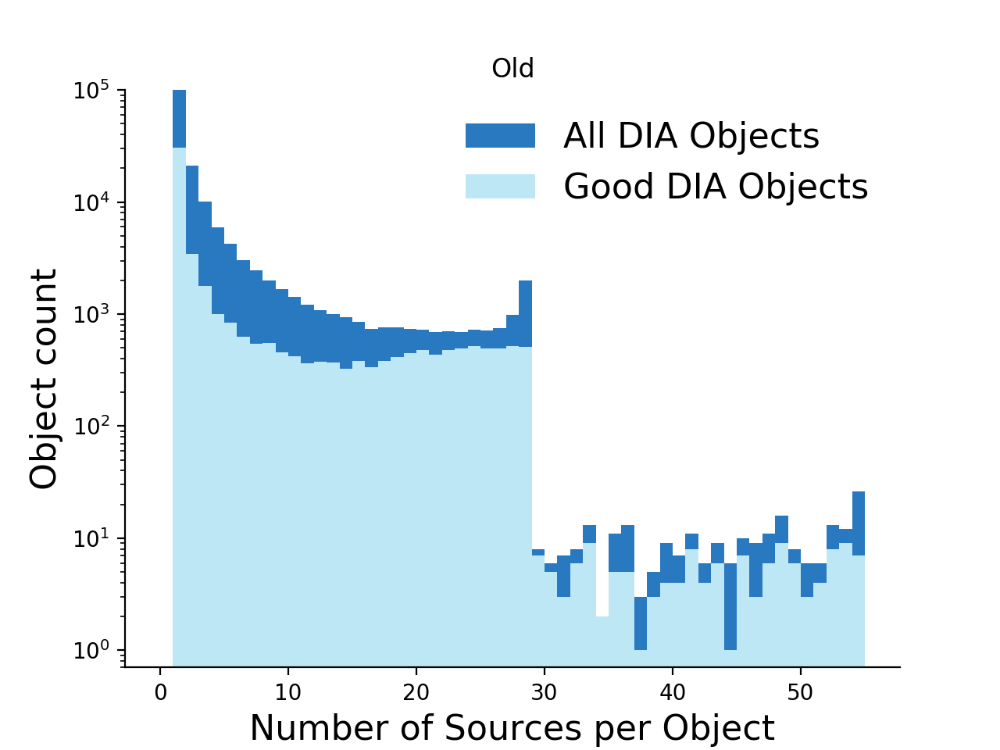

In [54]:
histogram_old = doa.plotDiaObjectHistogram(objTable_old, goodObj_old,
                                           label1='All DIA Objects', label2='Good DIA Objects', title='Old')

<IPython.core.display.Javascript object>


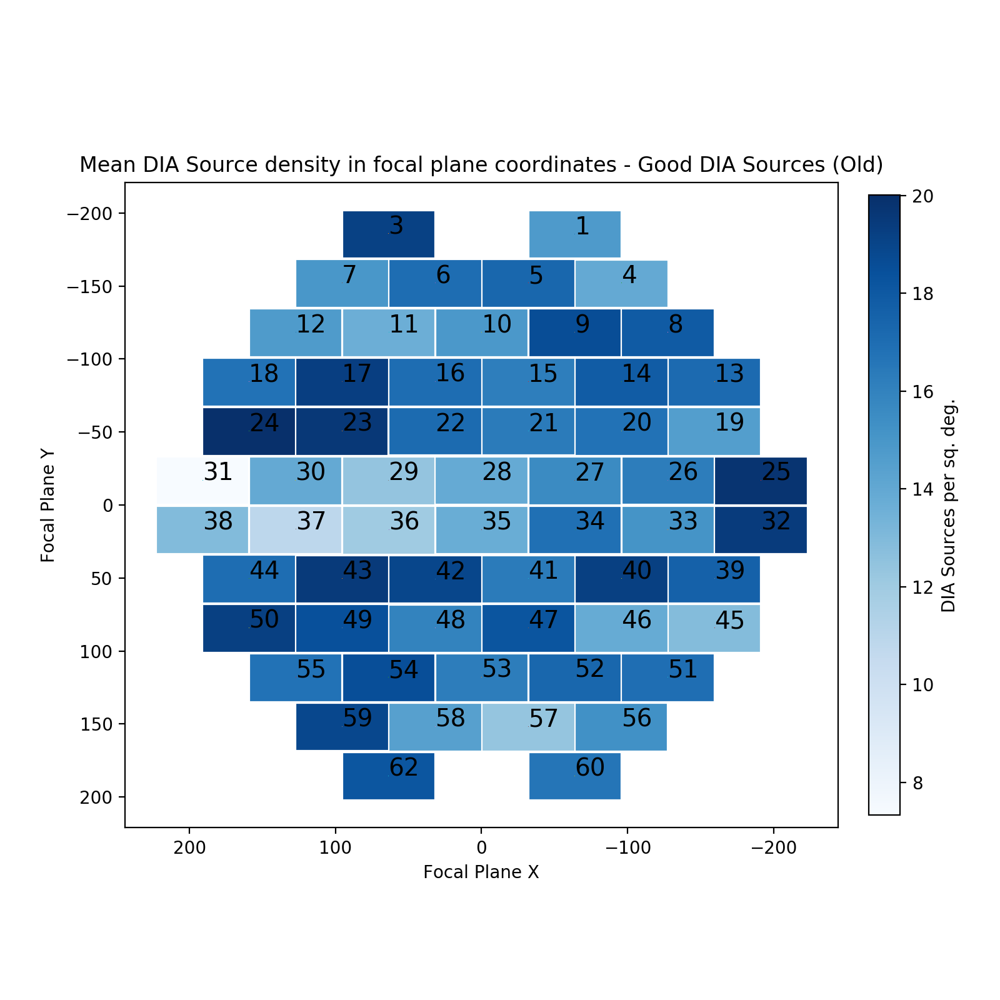

In [55]:
pla.plotDiaSourceDensityInFocalPlane(repo_old, goodSrc_old, title='- Good DIA Sources (Old)')

<IPython.core.display.Javascript object>


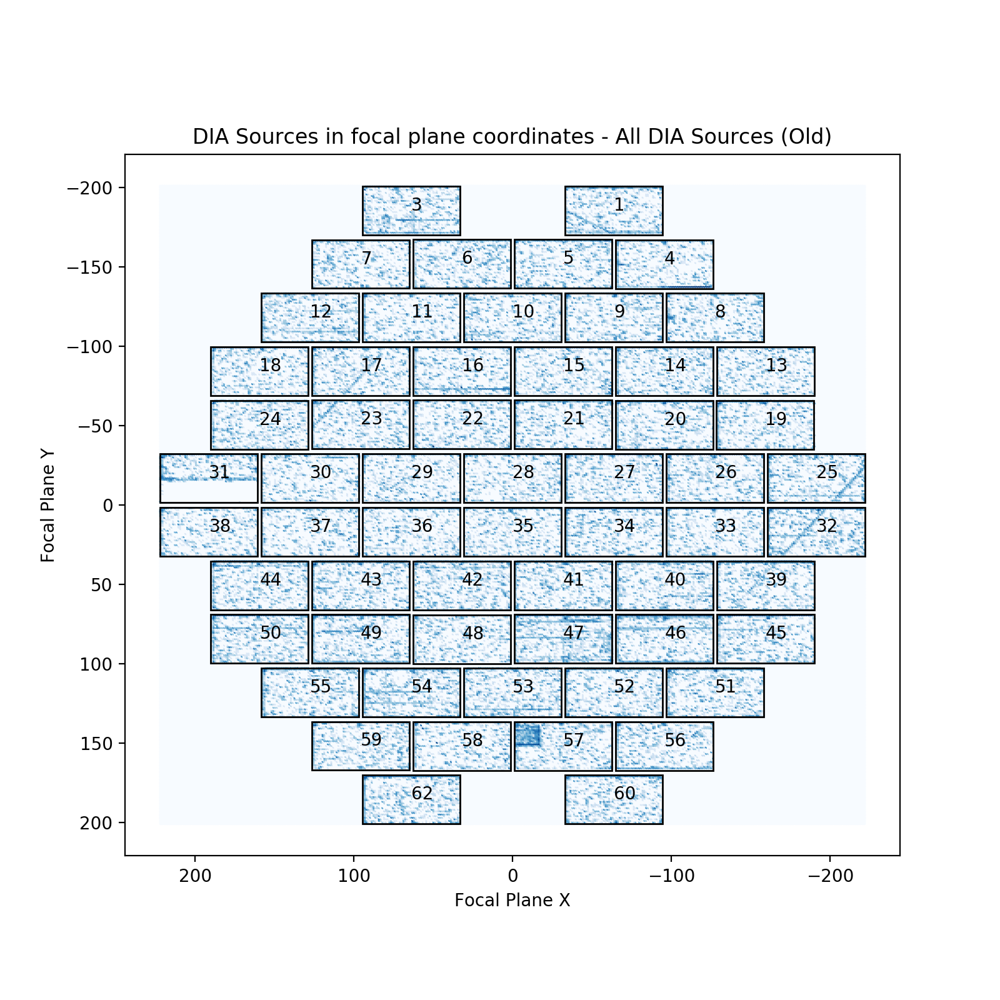

In [56]:
pla.plotDiaSourcesInFocalPlane(repo_old, srcTable_old, title='- All DIA Sources (Old)')

<IPython.core.display.Javascript object>


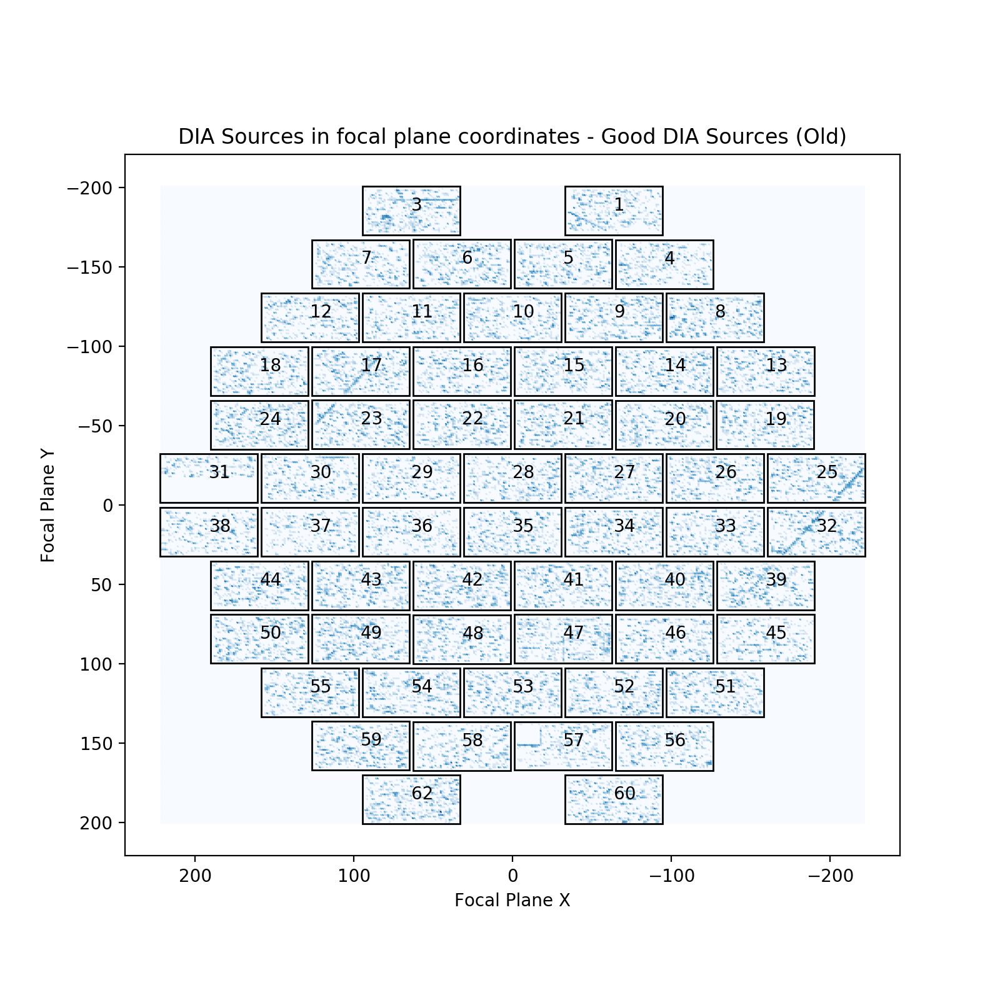

In [57]:
pla.plotDiaSourcesInFocalPlane(repo_old, goodSrc_old, title='- Good DIA Sources (Old)')